In [47]:
import numpy as np
import pandas as pd
import re
import seaborn as sms


In [48]:
#lectura del dataset
#location = '../ds_blend_students_2020/properati.csv'
location = 'C:/Users/araggio/Documents/DHcontenido/ds_blend_students_2020/properati.csv'
df_properati = pd.read_csv(location)

Diccionario

df_properati = DF con el dataset completo\
df_caba = DF solo con CABA (state_name)\
df_amb_data = DF con datos de ambientes extraidos de texto (merge (outer) de n_amb1 y n_amb2)

n_amb1 = serie con extraccion de ambientes de Description\
n_amb2 = serie con extraccion de ambientes de Title\

p_usd1 = serie con extraccion de precio en usd de Description
p_usd2 = serie con extraccion de precio en usd de Title



----------------------------------------------------------------------------------------\

Caracteristicas y problemas encontrados en los Datos

Registros Duplicados\

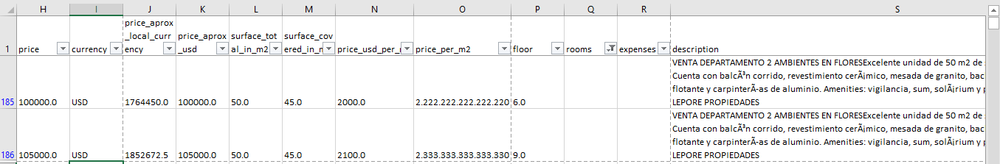

Hay registros que se duplican con diferente precio (¿Son actualización de las cotizaciones?)\


Precios y Supeficie

Price = Valor Total, expresado en Currency

price_usd_per_m2 = Price / surface_total_in_m2\
price_per_m2 = Price / surface_covered_in_m2\
(Los 2 tienen un problema de formato. Comparar contra la division para corregir los que estan mal). 

----------------------------------------------------------------------------------------\

Expensas:\
Son muchos los faltantes. Se puede extraer el dato de la Description pero para una proporcion muy baja de los registros. 


In [49]:
#Solo vamos a considerar CABA
df_properati.state_name.value_counts()

df_caba = df_properati.loc[df_properati.state_name == 'Capital Federal'] 

In [51]:
#Eliminamos columnas que descartamos a priori 
#esta ok el warning que tira?
df_caba.drop(['geonames_id', 'lat-lon' ,'lat', 'lon', 'properati_url', 'image_thumbnail'], axis = 1, inplace= True)

C:\Users\araggio\Anaconda3\envs\dhdsblend\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [52]:
#se dropearon las columnas
df_caba.head()

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,62000.0,USD,1093959.0,62000.0,55.0,40.0,1127.272727,1550.000000,NaN,NaN,NaN,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,72000.0,USD,1270404.0,72000.0,55.0,55.0,1309.090909,1309.090909,NaN,NaN,NaN,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,95000.0,USD,1676227.5,95000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado
7,7,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,138000.0,USD,2434941.0,138000.0,45.0,40.0,3066.666667,3450.000000,NaN,NaN,NaN,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...
8,8,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,195000.0,USD,3440677.5,195000.0,65.0,60.0,3000.000000,3250.000000,NaN,NaN,NaN,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERNANDEZ 1400 DOS AMBIENTES ESTRENAR ,..."


Extraccion datos desde Description y Title


Tratamiento de Cantidad de Ambientes\

Revisar si lo hecho toma los casos Ambiente|AMBIENTE, etc\
Hay casos en que habla de dormitorios y otros mas complejos donde describe con texto los diferentes ambientes.

In [109]:
desc1 = re.compile("\s*(?P<ambientes>\d{1,2}\s*amb)", flags = re.IGNORECASE)
# \s* = algun tipo de espacio en blanco (\s), y en cualquier cantidad (*)
# (?P<ambientes>  )  = crea el grupo ambientes
    # \d{1,2} = al menos un número del 0-9, maximo 2.
# \s*amb = cualquier número de espacios en blanco seguido de la cadena amb ¿porque afuera del grupo?

#creo la serie con el resultado del search
desc_n_amb_s = df_caba.description.apply(lambda x: None if x is np.NaN else re.search(desc1, x))

#creo la serie extrayendo el resultado del search
desc_n_amb = desc_n_amb_s.apply(lambda x: x if x is None else x.group("ambientes"))
#¿como appendeo esto al df de datos caba?


In [135]:
pd.set_option('display.max_rows', 1000)
desc_n_amb.value_counts()

3 amb                                                 2910
2 amb                                                 2863
4 amb                                                 1906
2 AMB                                                 1844
3 AMB                                                 1515
1 AMB                                                  957
4 AMB                                                  934
1 amb                                                  722
2 Amb                                                  420
3 Amb                                                  341
5 amb                                                  274
5 AMB                                                  247
4 Amb                                                  200
1 Amb                                                  103
6 amb                                                   85
6 AMB                                                   80
1AMB                                                    

In [220]:
#me quedo solo con la parte númerica
#las propiedades con mas de 7 ambientes son pocas y parecen outliers, las descarto
desc2 = re.compile("\d{1,2}")
n_amb1 = desc_n_amb.apply(lambda x: np.NaN if x is None  else re.search(desc2, x)[0])
n_amb1 = n_amb1[n_amb1.notna()].astype(int)
n_amb1 = n_amb1.apply(lambda x: np.NaN if (x > 7) else x)
n_amb1 = n_amb1[n_amb1.notna()].astype(int)

In [221]:
pd.set_option('display.max_rows', 10000)
print(n_amb1.dtypes)
print("-")
print(n_amb1.value_counts())
print("-")
print("tot value count", n_amb1.value_counts().sum())
print("-")
print(n_amb1.isnull().sum(), "-", n_amb1.notnull().sum())
print("-")
print(n_amb1.size)

int32
-
2    5270
3    4865
4    3076
1    1854
5     591
6     184
7      77
0      22
Name: description, dtype: int64
-
tot value count 15939
-
0 - 15939
-
15939


In [ ]:
#ambintes en Title


In [210]:
desc3 = re.compile("\s*(?P<ambientes>\d{1,2}\s*amb)", flags = re.IGNORECASE)

#creo la serie con el resultado del search
titulo_n_amb_s = df_caba.title.apply(lambda x: None if x is np.NaN else re.search(desc3, x))

#creo la serie extrayendo el resultado del search
titulo_n_amb = titulo_n_amb_s.apply(lambda x: x if x is None else x.group("ambientes"))
#¿como appendeo esto al df de datos caba?

In [218]:
#me quedo solo con la parte númerica
#las propiedades con mas de 7 ambientes son pocas y parecen outliers, las descarto
desc4 = re.compile("\d{1,2}")
n_amb2 = titulo_n_amb.apply(lambda x: np.NaN if x is None  else re.search(desc4, x)[0])
n_amb2 = n_amb2[n_amb2.notna()].astype(int)
n_amb2 = n_amb2.apply(lambda x: np.NaN if (x > 7) else x)
n_amb2 = n_amb2[n_amb2.notna()].astype(int)

In [219]:
n_amb2.value_counts()

2    3245
3    3020
4    1879
1    1091
5     494
6     129
7      62
0       1
Name: title, dtype: int64

In [250]:
#pruebo de joinear con merge el resultado de la extraccion del regex y el df_caba

df_amb_data = pd.merge(n_amb1,n_amb2,left_index = True, right_index = True, how = "outer")


In [224]:
#analizo como quedo la extracción del # de ambientes a partir de descripción y titulo

In [252]:
df_amb_data.head(200)

,description,title
0,2.0,2.0
2,2.0,2.0
3,3.0,3.0
13,3.0,NaN
16,4.0,4.0
21,NaN,4.0
35,NaN,4.0
51,NaN,6.0
52,3.0,3.0
59,NaN,3.0


In [253]:
df_amb_data.shape

(18858, 2)

In [285]:
df_amb_data.description.isna and df_amb_data.title.isna

<bound method Series.isna of 0         2.0
2         2.0
3         3.0
13        NaN
16        4.0
         ... 
121124    NaN
121131    3.0
121138    2.0
121153    3.0
121215    3.0
Name: title, Length: 18858, dtype: float64>

Tratamiento de Precios\

Ojo que hay duplicaciones en los valores de title. ej.!

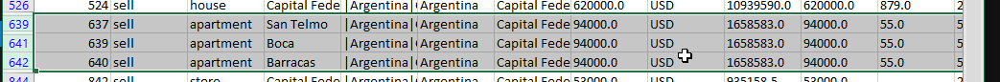

In [402]:
#Extraccion desde Title
desc5 = re.compile("\s*(?P<preciousd>(U\$D\s*\d*[.]\d*)|(U\$S\s*\d*[.]\d*))" , flags =  re.IGNORECASE)
usd_title_s = df_caba.title.apply(lambda x:  re.search(desc5, x))
usd_title = usd_title_s.apply(lambda x: x if x is None else x.group("preciousd"))

desc6 = re.compile("\d*[.]\d*")
p_usd2a = usd_title.apply(lambda x: np.NaN if x is None  else re.search(desc6, x)[0])
p_usd2 = p_usd2a.apply(lambda x: x if x is np.NaN else re.sub("[.]", "", x))
p_usd2 = p_usd2[p_usd2.notna()].astype(int)

In [403]:
p_usd2.dtypes

dtype('int32')

In [432]:
#Extraccion desde Descripcion
desc7 = re.compile("\s*(?P<preciousd>(U\$D\s*\d*[.]\d*)|(U\$S\s*\d*[.]\d*))" , flags =  re.IGNORECASE)
usd_desc_s = df_caba.description.apply(lambda x:  re.search(desc7, x))
usd_desc = usd_desc_s.apply(lambda x: x if x is None else x.group("preciousd"))

desc8 = re.compile("\d*[.]\d*")
p_usd1a = usd_desc.apply(lambda x: np.NaN if x is None  else re.search(desc8, x)[0])
p_usd1 = p_usd1a.apply(lambda x: x if x is np.NaN else re.sub("[.]", "", x))


In [473]:
p_usd1.dropna(inplace = True)
p_usd1.drop(index = p_usd1[p_usd1 == ''].index, inplace = True)
#p_usd1[p_usd1 == ''].index
p_usd1 = p_usd1[p_usd1.notna()].astype(int)

In [474]:
p_usd1.dtypes

dtype('int32')

Tratamiento de Superficie

In [480]:
#Regex para Extraer desde Description y Title,si fuera posible
sup1 = str("(\d{1,4}\s*M2)")
sup2 = "(\d{1,4}\s*M2\s*tot)"
sup3 = "(tot\D*\d{1,4}\s*M2)"
sup_pat = str(sup1 + "|" + sup2 + "|" + sup3)
sup1

'(\\d{1,4}\\s*M2)'

In [493]:
#Analizar como estan ahora los valores de superfice
#Tanto sup total como cuebierta estan vacias
df_caba[(df_caba.surface_total_in_m2.isna() & df_caba.surface_covered_in_m2.isna())]


,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
120,120,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,178000.0,USD,3.140721e+06,178000.00,NaN,55.0,NaN,3.236364e+03,12.0,NaN,NaN,"Depto de 3 amb. c/cochera cubierta, en piso 12...","Departamento con Plantas en Mendoza 2700, Capi..."
137,137,sell,PH,Colegiales,|Argentina|Capital Federal|Colegiales|,Argentina,Capital Federal,249000.0,USD,4.393480e+06,249000.00,NaN,126.0,NaN,1.976190e+03,1.0,6.0,NaN,Corredor Responsable: Jose Guendler - C.U.C.I....,PH al frente para reciclar: excelente oportuni...
157,157,sell,apartment,Balvanera,|Argentina|Capital Federal|Balvanera|,Argentina,Capital Federal,129000.0,USD,2.276140e+06,129000.00,NaN,80.0,NaN,1.612500e+03,NaN,4.0,NaN,Corredor Responsable: Daniel Acosta - CUCICBA ...,4 amb. c/dep muy bueno. Oportunidad.
166,166,sell,apartment,Caballito,|Argentina|Capital Federal|Caballito|,Argentina,Capital Federal,128000.0,USD,2.258496e+06,128000.00,NaN,51.0,NaN,2.509804e+03,6.0,2.0,NaN,Corredor Responsable: Mariano Aufseher - CUCIC...,"!!UNICO!! 2 amb c/ balcón, baulera VISTA PANOR..."
167,167,sell,apartment,Balvanera,|Argentina|Capital Federal|Balvanera|,Argentina,Capital Federal,118000.0,USD,2.082051e+06,118000.00,NaN,71.0,NaN,1.661972e+03,NaN,NaN,NaN,Corredor Responsable: Mariano Aufseher - CUCIC...,Venta departamento en Pasteur 509 Balvanera
178,178,sell,apartment,Barrio Norte,|Argentina|Capital Federal|Barrio Norte|,Argentina,Capital Federal,93000.0,USD,1.640938e+06,93000.00,NaN,35.0,NaN,2.657143e+03,NaN,1.0,NaN,Corredor Responsable: Alejandro Botta - CUCICB...,"Venta Mono dividido, amoblado, con muy buena r..."
277,277,sell,store,Monserrat,|Argentina|Capital Federal|Monserrat|,Argentina,Capital Federal,470000.0,USD,8.292915e+06,470000.00,NaN,20.0,NaN,2.350000e+04,NaN,NaN,NaN,Corredor Responsable: MARA D. MASSIONI - CUCIC...,OPORTUNIDAD VENTA LOCAL COMERCIAL EXCELENTE ZONA
282,282,sell,apartment,Palermo,|Argentina|Capital Federal|Palermo|,Argentina,Capital Federal,770000.0,USD,1.358626e+07,770000.00,NaN,153.0,NaN,5.032680e+03,NaN,4.0,NaN,"Venta - Departamento - Argentina, Buenos Aires...",Departamento en Venta ubicado en Palermo
302,302,sell,house,Pompeya,|Argentina|Capital Federal|Pompeya|,Argentina,Capital Federal,370000.0,USD,6.528465e+06,370000.00,NaN,20.0,NaN,1.850000e+04,NaN,7.0,NaN,Corredor Responsable: Marcelo Trujillo - CUCIC...,"Excelente Casa en Pompeya, sobre Av. La Plata"
340,340,sell,apartment,Parque Chas,|Argentina|Capital Federal|Parque Chas|,Argentina,Capital Federal,105900.0,USD,1.868553e+06,105900.00,NaN,42.0,NaN,2.521429e+03,NaN,1.0,NaN,Corredor Responsable: Uno Bienes Raices SRL - ...,Exclusivo Mono divisible. A ESTRENAR.Entrega A...


In [494]:
#Sup Total Vacia, pero Sup Cubierta con Datos
df_caba[(df_caba.surface_total_in_m2.isna() & df_caba.surface_covered_in_m2.notna())]


,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
120,120,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,178000.0,USD,3.140721e+06,178000.00,NaN,55.0,NaN,3.236364e+03,12.0,NaN,NaN,"Depto de 3 amb. c/cochera cubierta, en piso 12...","Departamento con Plantas en Mendoza 2700, Capi..."
137,137,sell,PH,Colegiales,|Argentina|Capital Federal|Colegiales|,Argentina,Capital Federal,249000.0,USD,4.393480e+06,249000.00,NaN,126.0,NaN,1.976190e+03,1.0,6.0,NaN,Corredor Responsable: Jose Guendler - C.U.C.I....,PH al frente para reciclar: excelente oportuni...
157,157,sell,apartment,Balvanera,|Argentina|Capital Federal|Balvanera|,Argentina,Capital Federal,129000.0,USD,2.276140e+06,129000.00,NaN,80.0,NaN,1.612500e+03,NaN,4.0,NaN,Corredor Responsable: Daniel Acosta - CUCICBA ...,4 amb. c/dep muy bueno. Oportunidad.
166,166,sell,apartment,Caballito,|Argentina|Capital Federal|Caballito|,Argentina,Capital Federal,128000.0,USD,2.258496e+06,128000.00,NaN,51.0,NaN,2.509804e+03,6.0,2.0,NaN,Corredor Responsable: Mariano Aufseher - CUCIC...,"!!UNICO!! 2 amb c/ balcón, baulera VISTA PANOR..."
167,167,sell,apartment,Balvanera,|Argentina|Capital Federal|Balvanera|,Argentina,Capital Federal,118000.0,USD,2.082051e+06,118000.00,NaN,71.0,NaN,1.661972e+03,NaN,NaN,NaN,Corredor Responsable: Mariano Aufseher - CUCIC...,Venta departamento en Pasteur 509 Balvanera
178,178,sell,apartment,Barrio Norte,|Argentina|Capital Federal|Barrio Norte|,Argentina,Capital Federal,93000.0,USD,1.640938e+06,93000.00,NaN,35.0,NaN,2.657143e+03,NaN,1.0,NaN,Corredor Responsable: Alejandro Botta - CUCICB...,"Venta Mono dividido, amoblado, con muy buena r..."
277,277,sell,store,Monserrat,|Argentina|Capital Federal|Monserrat|,Argentina,Capital Federal,470000.0,USD,8.292915e+06,470000.00,NaN,20.0,NaN,2.350000e+04,NaN,NaN,NaN,Corredor Responsable: MARA D. MASSIONI - CUCIC...,OPORTUNIDAD VENTA LOCAL COMERCIAL EXCELENTE ZONA
282,282,sell,apartment,Palermo,|Argentina|Capital Federal|Palermo|,Argentina,Capital Federal,770000.0,USD,1.358626e+07,770000.00,NaN,153.0,NaN,5.032680e+03,NaN,4.0,NaN,"Venta - Departamento - Argentina, Buenos Aires...",Departamento en Venta ubicado en Palermo
302,302,sell,house,Pompeya,|Argentina|Capital Federal|Pompeya|,Argentina,Capital Federal,370000.0,USD,6.528465e+06,370000.00,NaN,20.0,NaN,1.850000e+04,NaN,7.0,NaN,Corredor Responsable: Marcelo Trujillo - CUCIC...,"Excelente Casa en Pompeya, sobre Av. La Plata"
340,340,sell,apartment,Parque Chas,|Argentina|Capital Federal|Parque Chas|,Argentina,Capital Federal,105900.0,USD,1.868553e+06,105900.00,NaN,42.0,NaN,2.521429e+03,NaN,1.0,NaN,Corredor Responsable: Uno Bienes Raices SRL - ...,Exclusivo Mono divisible. A ESTRENAR.Entrega A...


In [495]:
#Sup Total con Datos, pero Sup Cubierta vacia
df_caba[(df_caba.surface_total_in_m2.notna() & df_caba.surface_covered_in_m2.isna())]

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
66,66,sell,apartment,Boedo,|Argentina|Capital Federal|Boedo|,Argentina,Capital Federal,72900.0,USD,1.286284e+06,72900.00,38.0,NaN,1918.421053,NaN,NaN,NaN,1200.0,CODIGO: 5 ubicado en: Avenida Independencia 26...,"DEPARTAMENTO NUEVO, DE UN AMBIENTE amplio, 3 A..."
370,370,sell,store,Recoleta,|Argentina|Capital Federal|Recoleta|,Argentina,Capital Federal,139000.0,USD,2.452586e+06,139000.00,33.0,NaN,4212.121212,NaN,NaN,NaN,NaN,"LOCALVenta de Local en Recoleta, Capital Fede...",LOCAL EN VENTA
784,784,sell,apartment,Villa Devoto,|Argentina|Capital Federal|Villa Devoto|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,68.0,NaN,NaN,NaN,NaN,3.0,1500.0,Semipiso en Venta de 3 ambientes en Villa Devo...,DEPARTAMENTO EN VENTA
785,785,sell,apartment,Villa Pueyrredón,|Argentina|Capital Federal|Villa Pueyrredón|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,68.0,NaN,NaN,NaN,NaN,3.0,1500.0,Hermoso semipiso en Venta de 3 ambientes. Apto...,DEPARTAMENTO EN VENTA
914,914,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,170000.0,USD,2.999565e+06,170000.00,69.0,NaN,2463.768116,NaN,NaN,2.0,2500.0,Venta de Departamento 2 AMBIENTES con COCHERA ...,DEPARTAMENTO EN VENTA
1583,1583,sell,apartment,Almagro,|Argentina|Capital Federal|Almagro|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,45.0,NaN,NaN,NaN,NaN,1.0,NaN,"Ubicado a dos cuadras del Hospital Italiano, u...",PALESTINA HAUS
1584,1584,sell,apartment,Almagro,|Argentina|Capital Federal|Almagro|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,97.0,NaN,NaN,NaN,NaN,2.0,NaN,"Ubicado a dos cuadras del Hospital Italiano, u...",PALESTINA HAUS
1585,1585,sell,apartment,Almagro,|Argentina|Capital Federal|Almagro|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,98.0,NaN,NaN,NaN,NaN,3.0,NaN,"Ubicado a dos cuadras del Hospital Italiano, u...",PALESTINA HAUS
1798,1798,sell,apartment,Almagro,|Argentina|Capital Federal|Almagro|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,22.0,NaN,NaN,NaN,NaN,NaN,NaN,Excelente monoambiente apto profesional. Ideal...,U$D 70.000 - Departamento en Venta - Perón ...
1860,1860,sell,apartment,Balvanera,|Argentina|Capital Federal|Balvanera|,Argentina,Capital Federal,NaN,NaN,NaN,NaN,41.0,NaN,NaN,NaN,NaN,NaN,NaN,Excelente monoambiente divisible al frente con...,U$D 72.000 - Departamento en Venta - Adolfo Al...


In [516]:
df_caba_model = df_caba
df_caba_model["Surface_total"] = 0

C:\Users\araggio\Anaconda3\envs\dhdsblend\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [506]:
df_caba.Surface_Cov_Model = df_caba.surface_covered_in_m2

In [507]:
df_caba.head()

,Unnamed: 0,operation,property_type,place_name,place_with_parent_names,country_name,state_name,price,currency,price_aprox_local_currency,price_aprox_usd,surface_total_in_m2,surface_covered_in_m2,price_usd_per_m2,price_per_m2,floor,rooms,expenses,description,title
0,0,sell,PH,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,62000.0,USD,1093959.0,62000.0,55.0,40.0,1127.272727,1550.000000,NaN,NaN,NaN,"2 AMBIENTES TIPO CASA PLANTA BAJA POR PASILLO,...",2 AMB TIPO CASA SIN EXPENSAS EN PB
2,2,sell,apartment,Mataderos,|Argentina|Capital Federal|Mataderos|,Argentina,Capital Federal,72000.0,USD,1270404.0,72000.0,55.0,55.0,1309.090909,1309.090909,NaN,NaN,NaN,2 AMBIENTES 3ER PISO LATERAL LIVING COMEDOR AM...,2 AMB 3ER PISO CON ASCENSOR APTO CREDITO
3,3,sell,PH,Liniers,|Argentina|Capital Federal|Liniers|,Argentina,Capital Federal,95000.0,USD,1676227.5,95000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PH 3 ambientes con patio. Hay 3 deptos en lote...,PH 3 amb. cfte. reciclado
7,7,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,138000.0,USD,2434941.0,138000.0,45.0,40.0,3066.666667,3450.000000,NaN,NaN,NaN,EXCELENTE MONOAMBIENTE A ESTRENAR AMPLIO SUPER...,JOSE HERNANDEZ 1400 MONOAMBIENTE ESTRENAR CAT...
8,8,sell,apartment,Belgrano,|Argentina|Capital Federal|Belgrano|,Argentina,Capital Federal,195000.0,USD,3440677.5,195000.0,65.0,60.0,3000.000000,3250.000000,NaN,NaN,NaN,EXCELENTE DOS AMBIENTES ESTRENAR AMPLIO SUPER...,"JOSE HERNANDEZ 1400 DOS AMBIENTES ESTRENAR ,..."
